# `Материалы кафедры ММП факультета ВМК МГУ. Введение в глубокое обучение.`

# `Семинар 11. Генеративно-состязательные сети`

### `Материалы составили Оганов Александр (@welmud), Находнов Максим`

#### `Москва, Весенний семестр 2025`

`Материалы`
- [Generative Adversarial Networks](https://arxiv.org/abs/1406.2661)

- [How to Train GAN](https://github.com/soumith/ganhacks)

- [Towards Principled Methods for Training Generative Adversarial Networks](https://arxiv.org/abs/1701.04862)

- [Wasserstein GAN](https://arxiv.org/abs/1701.07875)

- [From GAN to WGAN](https://lilianweng.github.io/posts/2017-08-20-gan/)

- [Improved Training of Wasserstein GANs](https://arxiv.org/abs/1704.00028)

- [WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf)

- [f-GAN: Training Generative Neural Samplers using Variational Divergence Minimization](https://arxiv.org/abs/1606.00709)

- [Greedification Operators for Policy Optimization: Investigating Forward and Reverse KL Divergences](https://jmlr.org/papers/volume23/21-054/21-054.pdf)

- [Глубокое обучение, ВМК МГУ](https://github.com/Dyakonov/DL/blob/47f2efbadfd15f8d0a5f5cb209386aba64326eb6/2020/DL2020_053gan_13n.pdf)
- [DGM-AIMasters-course seminar8](https://github.com/r-isachenko/2024-DGM-AIMasters-course/blob/5aa2879d9d4091cbed6b8d86900ee36e47489767/seminars/seminar8/seminar8.ipynb)

- [DGM-AIMasters-course seminar9](https://github.com/r-isachenko/2024-DGM-AIMasters-course/blob/5aa2879d9d4091cbed6b8d86900ee36e47489767/seminars/seminar9/seminar9.ipynb)

- [HSE_DPO_DL Seminar 07](https://github.com/nakhodnov17/HSE_DPO_DL/blob/40bee88bfae8c601f1068d8d70ad0d04078286dd/Seminars/Seminar%2007/Seminar%2007.%20GAN.ipynb)

- [HSE_DPO_DL Seminar 07 slides](https://github.com/nakhodnov17/HSE_DPO_DL/blob/40bee88bfae8c601f1068d8d70ad0d04078286dd/Seminars/Seminar%2007/Seminar%2007.%20GAN.pdf)

- [Разные реализации](https://github.com/eriklindernoren/PyTorch-GAN/tree/master)

- [DCGAN](https://arxiv.org/pdf/1511.06434.pdf)

In [1]:
import os
import time
import random

import wandb

import numpy as np
import matplotlib_inline
import matplotlib.pyplot as plt
from ml_collections import ConfigDict

import torch
from torchvision.datasets import MNIST

from torchvision.utils import make_grid
import torchvision.transforms as transforms

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [2]:
def set_global_seed(seed: int) -> None:
    """
    Set global seed for reproducibility.
    """

    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    random.seed(seed)
    np.random.seed(seed)

set_global_seed(42)

### `Чем плоха дивергенция?`

Далее будем использовать стандартные обозначения:

\begin{align}
 &\pi(x) \text{ — распределение данных,}\\
 &p(x \mid \mu, \sigma) \text{ — распределение, в котором мы обучаем параметры $\mu$, $\sigma$}.
\end{align}



На лекции мы обсуждали эффекты **mean-seeking**, **mode-seeking**, которые возникают при оптимизации **forward** и **reverse** дивергенции соответсвенно. Напоминим, что:


\begin{align}
 &\textbf{Forward — } \text{KL}(\pi(x) \| p(x \mid \mu, \sigma)), \\
 &\textbf{Backward — } \text{KL}(p(x \mid \mu, \sigma) \| \pi(x)).
\end{align}

Наша первая цель воспроизвести эти эффекты на практике. Для реализации смеси распределений и других вероятностных объектов, будем использовать модуль `torch.distributions`.

В `torch.distributions` реализованы все стандартные распределения, подсчет KL-дивергенций, сэмплирование случайных величин .sample() и дифференцируемое по параметрам сэмплирование случайных величин .rsample() (не для всех распределений это возможно). Много чего реализовано в очень удобном формате, например, смеси распределений и вычисления скор-функций.

Подробнее можно почитать [в документации](https://pytorch.org/docs/stable/distributions.html).

Чтобы задать нормальное распределение, нам достаточно воспользоваться классом `torch.distributions.Normal`.

In [3]:
single_gaussian = torch.distributions.Normal(
    loc   = torch.tensor(0.),
    scale = torch.tensor(1.)
)

Зададим распределение данных, которое будем моделировать смесью нормальных распределений.

\begin{align}
&\pi(x) = 0.8 p_1(x) + 0.2 p_2(x)\\
&p_1(x) = \mathcal{N}(x \mid -2, \frac{1}{4})\\
&p_2(x) = \mathcal{N}(x \mid 2, \frac{1}{4})\\
\end{align}

In [4]:
mixture_gaussian = torch.distributions.MixtureSameFamily(
    mixture_distribution=torch.distributions.Categorical(probs=torch.tensor([0.8, 0.2])),
    component_distribution=torch.distributions.Normal(
        loc   = torch.tensor([-2., 2.]),
        scale = torch.tensor([0.5, 0.5])
    )
)

In [5]:
@torch.no_grad()
def plot_distributions(X, real_log_prob, model_log_prob=None, title=None, ax=None):
    res1 = real_log_prob(X).exp()
    if model_log_prob is not None:
        res2 = model_log_prob(X).exp()

    if ax is None:
        (fig, ax), show = plt.subplots(1, 1, figsize=(6, 4)), True
    else:
        show = False

    ax.plot(X.numpy(), res1.numpy(), color='b', linewidth=3, label=r'$\pi(\mathbf{x})$')
    ax.fill_between(X.numpy(), np.zeros_like(X.numpy()), res1.numpy(),  color='b', alpha=0.2)

    if model_log_prob is not None:
        ax.plot(X.numpy(), res2.numpy(), 'g', linewidth=3, label=r'$p(\mathbf{x} | \mu, \sigma)$')
        ax.fill_between(X.numpy(), np.zeros_like(X.numpy()), res2.numpy(),  color='g', alpha=0.2)

    if title is not None:
        ax.set_title(title)

    ax.legend()
    ax.grid(True)
    ax.set_xlabel('support')

    if show:
        fig.tight_layout()
        plt.show()

Визуализируем плотности вероятностей соотвествующих распределений.

In [6]:
X = torch.linspace(-6, 6, 500, dtype=torch.float32)

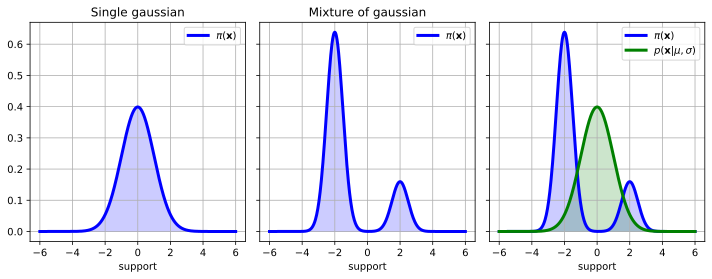

In [7]:
fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(10, 4))

plot_distributions(X, single_gaussian.log_prob, title='Single gaussian', ax=ax[0])
plot_distributions(X, mixture_gaussian.log_prob, title='Mixture of gaussian', ax=ax[1])
plot_distributions(X, mixture_gaussian.log_prob, single_gaussian.log_prob, ax=ax[2])

plt.tight_layout()

Мы рассмотрим **Forward** и **Reverse** KL-дивергенцию и дивергенцию Йенсена — Шеннона.

\begin{align}
&\text{KL}(\pi || p) = \int \pi(x) \log \frac{\pi(x)}{p(x)}dx, \\
&\text{KL}(p || \pi) = \int p(x) \log \frac{p(x)}{\pi(x)}dx, \\
&\text{JSD}(\pi || p) = \frac{1}{2} \Bigg[ \text{KL}\Big(\pi(x) || \frac{\pi(x) + p(x)}{2}\Big) + \text{KL}\Big(p(x) || \frac{\pi(x) + p(x)}{2}\Big) \Bigg].
\end{align}

Мы параметризуем распределение $p$ гауссианой и будем обучать ее параметры.

In [8]:
def KLD(X, log_prob1, log_prob2):
    dt = (X.max() - X.min()) / len(X)
    return (log_prob1(X).exp() * (log_prob1(X) - log_prob2(X))).sum() * dt

def JSD(X, log_prob1, log_prob2):
    def log_prob_mean(x):
        prob_mean = (log_prob1(x).exp() + log_prob2(x).exp()) / 2.0
        return prob_mean.log()

    return (KLD(X, log_prob1, log_prob_mean) + KLD(X, log_prob2, log_prob_mean)) / 2.0

In [9]:
def get_trainable_gaussian(mu=-1.0, sigma=0.5):
    mu    = torch.tensor(mu, requires_grad=True, dtype=torch.double)
    sigma = torch.tensor(sigma, requires_grad=True, dtype=torch.double)

    single_gaussian = torch.distributions.Normal(mu, sigma)
    optimizer = torch.optim.SGD([mu, sigma], lr=0.03)

    return single_gaussian, optimizer

In [10]:
forward_KL_loss_fn = lambda X, real_log_prob, model_log_prob: KLD(X, real_log_prob, model_log_prob)
reverse_KL_loss_fn = lambda X, real_log_prob, model_log_prob: KLD(X, model_log_prob, real_log_prob)
JSD_loss_fn        = lambda X, real_log_prob, model_log_prob: JSD(X, real_log_prob, model_log_prob)

Посмотрим на иницилизацию.

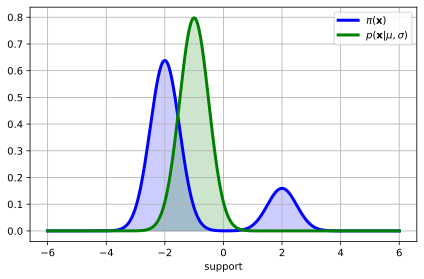

In [11]:
single_gaussian, _ = get_trainable_gaussian()

plot_distributions(X, mixture_gaussian.log_prob, single_gaussian.log_prob)

In [12]:
def solve_task(optimizer, loss_fn, real_log_prob, model_log_prob, epochs, verbose=True, freq=10):
    n_plots = (epochs // freq) * verbose + 2
    n_rows, n_cols = (n_plots - 1) // 3 + 1, 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 2.5 * n_rows), sharex=True, sharey=True)
    axes = axes.reshape(-1)

    plot_distributions(X, real_log_prob, model_log_prob, title=f'Initialization', ax=axes[0])

    for epoch in range(epochs):
        optimizer.zero_grad()

        loss = loss_fn(X, real_log_prob, model_log_prob)
        loss.backward()
        optimizer.step()

        if verbose and epoch % freq == 0:
            plot_distributions(
                X, real_log_prob, model_log_prob,
                title=f'Step: {epoch}, loss: {loss:.2f}', ax=axes[epoch // 10 + 1]
            )

    plot_distributions(X, real_log_prob, model_log_prob, title=f'Final, loss: {loss:.2f}', ax=axes[-1])

    fig.tight_layout()
    plt.show()

### `Forward KL optimization`

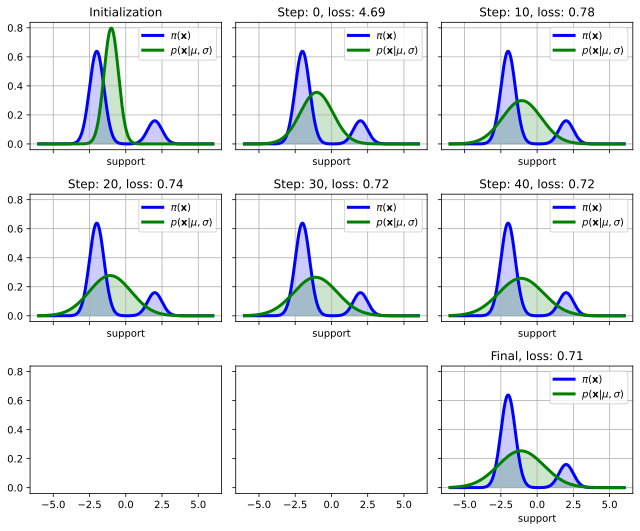

In [13]:
single_gaussian, optimizer = get_trainable_gaussian()

solve_task(optimizer, forward_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

### `Reverse KL optimization`

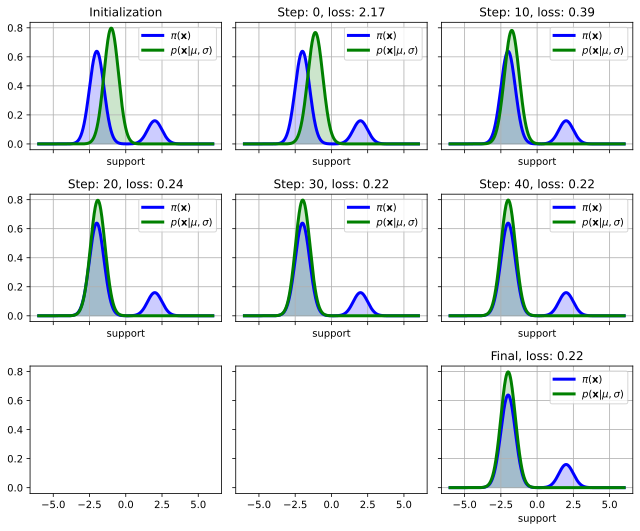

In [14]:
single_gaussian, optimizer = get_trainable_gaussian()

solve_task(optimizer, reverse_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

Исследуем как ведет себя обучение в зависимости от разных иницилизаций. Наша цель понять, как **mode-seeking** влияет на обучение.

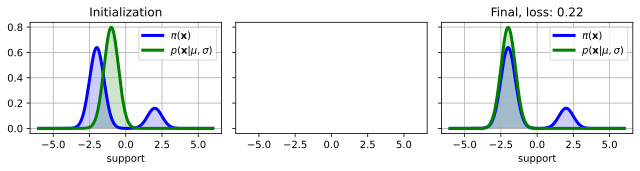

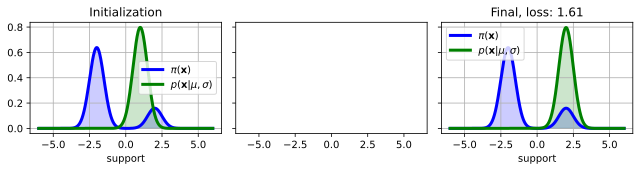

In [15]:
for mu in [-1.0, 1.0]:
    single_gaussian, optimizer = get_trainable_gaussian(mu=mu)
    solve_task(
        optimizer, reverse_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob,
        epochs=50, verbose=False
    )

### `Jensen Shannon optimization`

Важно понять, переносятся ли эффект **mode-seeking** на дивергенцию Йенсена — Шеннона, так как именно ее мы оптимизируем в классических `GAN` моделях.

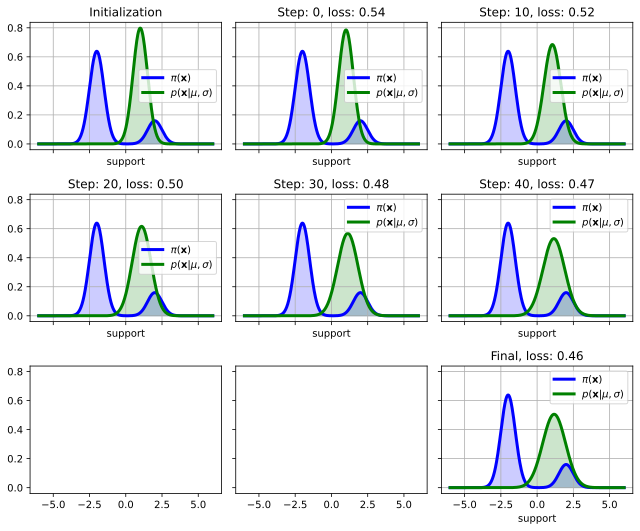

In [16]:
single_gaussian, optimizer = get_trainable_gaussian(mu=1.0)

solve_task(optimizer, JSD_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

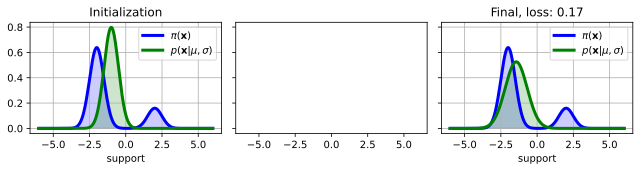

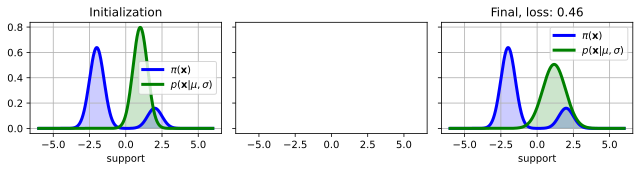

In [17]:
for mu in [-1.0, 1.0]:
    single_gaussian, optimizer = get_trainable_gaussian(mu=mu)
    solve_task(
        optimizer, JSD_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50, verbose=False
    )

## `Обучение GAN`

Посмотрим как обучается `GAN` модели на модельном примере. Наша цель рассмотреть какие эффекты возникают при обучении: возникает ли колапсирование в моду (mode collapse), какие сэмплы получаются, как работает дискриминатор и как выглядит его предсказание.




In [18]:
def plot_gan_data(noise_fn, data_fn, data_pdf=None, samples=5000):
    noise = noise_fn(samples).numpy().flatten()
    target = data_fn(samples).numpy().flatten()

    fig, ax = plt.subplots(1, 1, figsize=(6, 4))

    ax.hist(noise, label='noise', alpha=0.5, density=True, color='b')
    ax.hist(target, label='target', alpha=0.5, density=True, color='g')
    if data_pdf is not None:
        x = np.linspace(-6, 6, 100)
        ax.plot(x, data_pdf(x), 'g', label='real distribution')

    ax.grid(True)
    ax.legend(loc='upper left')

    fig.tight_layout()
    plt.show()

def plot_gan_loss(loss_g, loss_d_real, loss_d_fake):
    fig, ax = plt.subplots(1, 2, figsize=(9, 3))

    ax[0].plot(loss_g)

    ax[1].plot(loss_d_real, label="real")
    ax[1].plot(loss_d_fake, label="fake")
    ax[1].plot(loss_d_real + loss_d_fake, label="all")

    ax[1].legend()

    ax[0].grid(True)
    ax[1].grid(True)

    ax[0].set_title("Generator loss")
    ax[1].set_title("Discriminator loss")

    fig.tight_layout()
    plt.show()

@torch.no_grad()
def visualize_GAN(gan, data_pdf=None, ax=None):
    size = 500
    x = np.linspace(-6, 6, 100)
    bins = np.linspace(-6, 6, 60)

    real_data = gan.data_fn(size)
    noise = gan.noise_fn(size)
    sampled_data = gan.generate_samples(noise)
    d_probs = gan.D(torch.from_numpy(x).float().unsqueeze(-1))

    if ax is None:
        (fig, ax), show = plt.subplots(1, 1, figsize=(6, 4)), True
    else:
        show = False

    ax.plot(x, d_probs.numpy(), 'b', label='D distribution')

    ax.hist(noise.numpy(), label='noise', alpha=0.5, density=True, color='b', bins=bins)
    ax.hist(real_data.numpy(), label='real data', alpha=0.5, density=True, color='g', bins=bins)
    ax.hist(sampled_data.numpy(), label='G samples', alpha=0.5, density=True, color='r', bins=bins)

    if data_pdf is not None:
        ax.plot(x, data_pdf(x), 'g', label='real distribution')

    ax.grid(True)
    ax.legend(loc='upper left')

    if show:
        fig.tight_layout()
        plt.show()

In [19]:
class VanillaGAN(torch.nn.Module):
    def __init__(
        self, G, D, noise_fn, data_fn, batch_size, lr_G=2e-4, lr_D=1e-3
    ):
        """A GAN class for holding and training a generator and discriminator
        Args:
            G: a Generator network
            D: A Discriminator network
            noise_fn: function f(num: int) -> pytorch tensor, (latent vectors)
            data_fn: function f(num: int) -> pytorch tensor, (real samples)
            batch_size: batch size for training
            lr_G: learning rate for the generator
            lr_D: learning rate for the discriminator
        """
        super().__init__()

        self.G = G
        self.D = D

        self.noise_fn = noise_fn
        self.data_fn = data_fn

        self.batch_size = batch_size

        self.criterion = torch.nn.BCELoss()

        self.optim_G = torch.optim.Adam(
            G.parameters(), lr=lr_G, betas=(0.5, 0.999)
        )
        self.optim_D = torch.optim.Adam(
            D.parameters(), lr=lr_D, betas=(0.5, 0.999)
        )

        self.register_buffer(
            'target_zeros', torch.zeros((self.batch_size, 1), dtype=torch.float32), persistent=False
        )
        self.register_buffer(
            'target_ones', torch.ones((self.batch_size, 1), dtype=torch.float32), persistent=False
        )

    @torch.no_grad()
    def generate_samples(self, latents=None, n=None):
        """Sample from the generator.
        Args:
            latents: A pytorch latent vector
            n: number of generated samples
        vectors.
        ! We don't need grad for generated samples
        """

        if latents is None:
            latents = self.noise_fn(self.batch_size if n is None else n)
        else:
            assert n is None

        return self.G(latents)

    def train_step_G(self):
        """Train the generator one step and return the loss."""
        self.optim_G.zero_grad()

        latents = self.noise_fn(self.batch_size)

        generated = self.G(latents)
        classifications = self.D(generated)

        loss = self.criterion(classifications, self.target_ones)
        loss.backward()

        self.optim_G.step()

        return loss.item()

    def train_step_D(self):
        """Train the discriminator one step and return the losses."""
        self.optim_D.zero_grad()

        # Compute loss for samples from data distribution
        real_samples = self.data_fn(self.batch_size)
        pred_real = self.D(real_samples)
        loss_real = self.criterion(pred_real, self.target_ones)

        # Compute loss for fake samples
        latents = self.noise_fn(self.batch_size)

        fake_samples = self.generate_samples(latents)
        pred_fake = self.D(fake_samples)
        loss_fake = self.criterion(pred_fake, self.target_zeros)

        # Combine losses
        loss = (loss_real + loss_fake) / 2
        loss.backward()

        self.optim_D.step()

        return loss_real.item(), loss_fake.item()

In [20]:
def get_simple_model(hidden_sizes):
    assert len(hidden_sizes) > 1

    network = torch.nn.Sequential()
    for in_features, out_features in zip(hidden_sizes[:-2], hidden_sizes[1:-1]):
        network.append(torch.nn.Linear(in_features, out_features))
        network.append(torch.nn.ReLU())

    network.append(torch.nn.Linear(hidden_sizes[-2], hidden_sizes[-1]))

    return network

In [21]:
def noise_fn(x):
    return torch.rand((x, 1)) - 0.5

In [22]:
mixture_gaussian = torch.distributions.MixtureSameFamily(
    torch.distributions.Categorical(torch.tensor([0.7, 0.3])),
    torch.distributions.Normal(
        loc=torch.tensor([-3., 3.]),
        scale=torch.tensor([1., 1.])
    )
)

def data_fn(x):
    return mixture_gaussian.sample((x, 1))

def data_pdf(x):
    return mixture_gaussian.log_prob(torch.tensor(x)).exp().numpy()

In [23]:
def get_GAN(G_hidden_sizes=(1, 64, 64, 64, 1), D_hidden_sizes=(1, 64, 64, 64, 1)):
    G = get_simple_model(G_hidden_sizes)
    D = get_simple_model(D_hidden_sizes).append(torch.nn.Sigmoid())

    gan = VanillaGAN(G, D, noise_fn, data_fn, batch_size=32)

    return gan

Мы будем визуализировать:

- Шум, который подали в генератор
- Распределение данных
- Датасет (сэмплы из расределения данных)
- Сэмплы которые сгенерировал генератор
- Выходы дискриминатора (распределение дискриминатора)

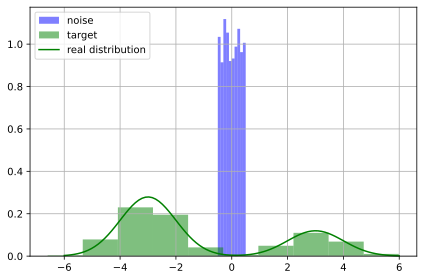

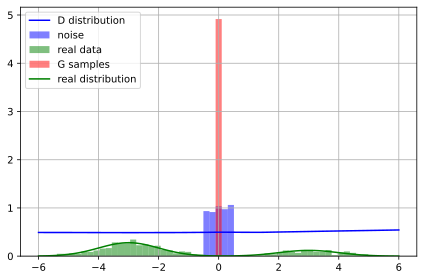

In [24]:
gan = get_GAN()

plot_gan_data(noise_fn, data_fn, data_pdf)
visualize_GAN(gan, data_pdf=data_pdf)

In [25]:
def train_1D_GAN(gan, n_batches=100, epochs=50, n_D_steps_per_G=1):
    def is_logging_epoch(epoch):
        return (epoch % 10 == 0 or epoch == epochs - 1)

    start_time = time.time()

    loss_g, loss_d_real, loss_d_fake = [], [], []
    for epoch in range(epochs):
        loss_g_running, loss_d_real_running, loss_d_fake_running = 0.0, 0.0, 0.0

        if is_logging_epoch(epoch):
            fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharex=True, sharey=True)

        for idx in range(n_batches):
            if idx == 0 and is_logging_epoch(epoch):
                axes[0].set_title('Train D for one batch: start')
                visualize_GAN(gan, data_pdf=data_pdf, ax=axes[0])

            for _ in range(n_D_steps_per_G):
                loss_D_real_batch, loss_D_fake_batch = gan.train_step_D()
                loss_d_real_running += loss_D_real_batch
                loss_d_fake_running += loss_D_fake_batch

            if idx == 0 and is_logging_epoch(epoch):
                axes[1].set_title('Train D for one batch: end')
                visualize_GAN(gan, data_pdf=data_pdf, ax=axes[1])

            loss_G_batch = gan.train_step_G()
            loss_g_running += loss_G_batch

        loss_g.append(loss_g_running / n_batches)
        loss_d_real.append(loss_d_real_running / (n_batches * n_D_steps_per_G))
        loss_d_fake.append(loss_d_fake_running / (n_batches * n_D_steps_per_G))

        if is_logging_epoch(epoch):
            fig.suptitle(
                "Epoch {0}/{1} ({2:.1f}s): G={3:.3f}, Dr={4:.3f}, Df={5:.3f}".format(
                    epoch + 1, epochs, time.time() - start_time,
                    loss_g[-1], loss_d_real[-1], loss_d_fake[-1]
                )
            )
            axes[2].set_title('After epoch')
            visualize_GAN(gan, data_pdf=data_pdf, ax=axes[2])

            fig.tight_layout()
            plt.show()

    return np.array(loss_g), np.array(loss_d_real), np.array(loss_d_fake)

Обучим модель и зафиксируем сид, так как нам важна воспроизводимость результатов. Будем обучать генератор каждую итерацию.

**Вопрос:** Почему обучать генератор каждую итерацию плохо?

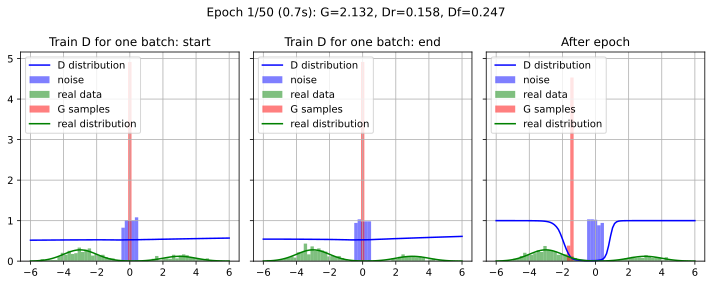

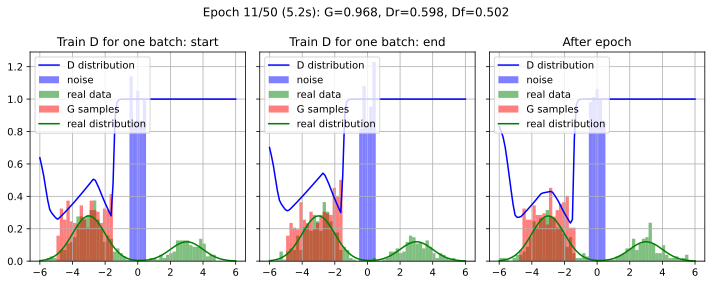

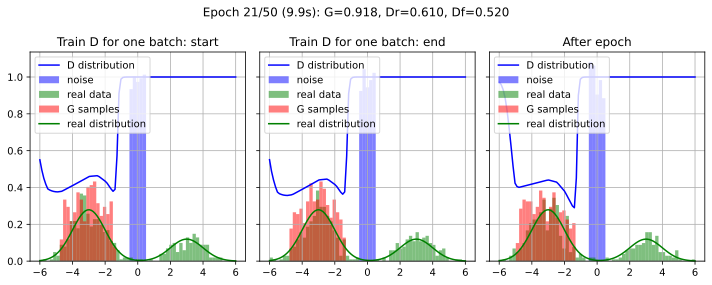

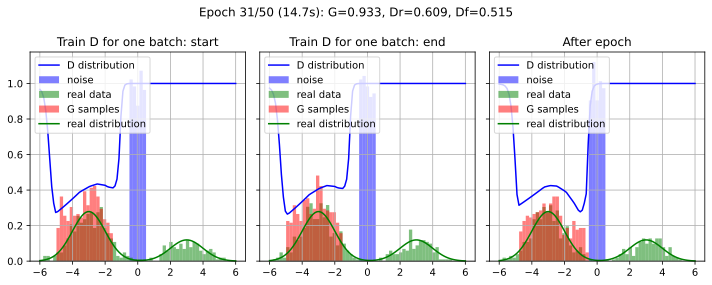

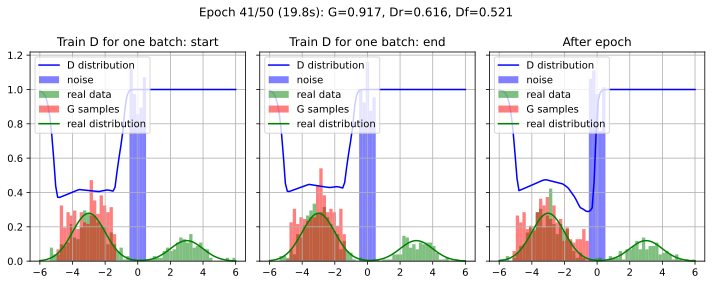

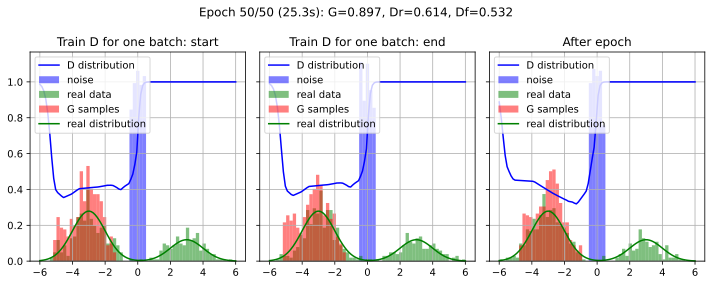

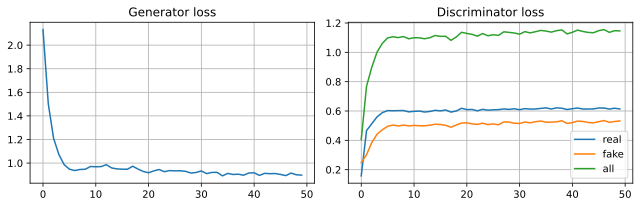

In [26]:
set_global_seed(0)

gan = get_GAN()
loss_g_1, loss_d_real_1, loss_d_fake_1 = train_1D_GAN(gan)
plot_gan_loss(loss_g_1, loss_d_real_1, loss_d_fake_1)

В итоге мы получили коллапсирование в левую моду. Обучим модель еще раз на другом сиде, то есть возьмем другую инициализацию модели.

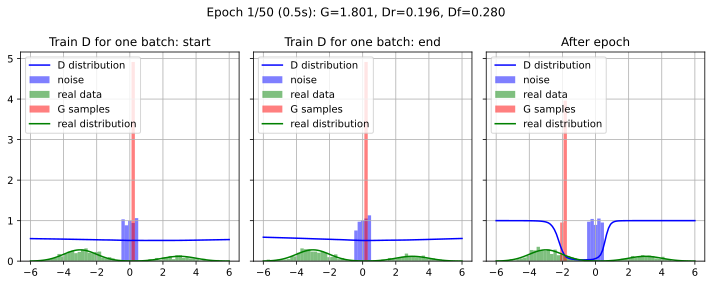

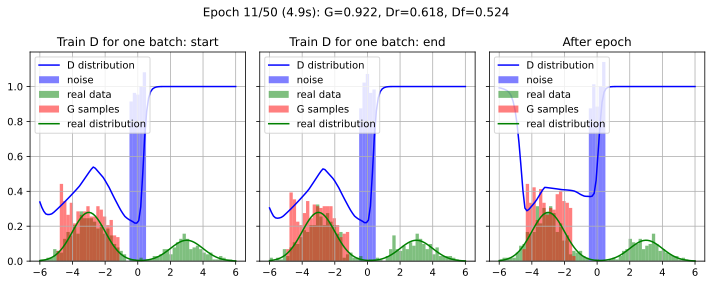

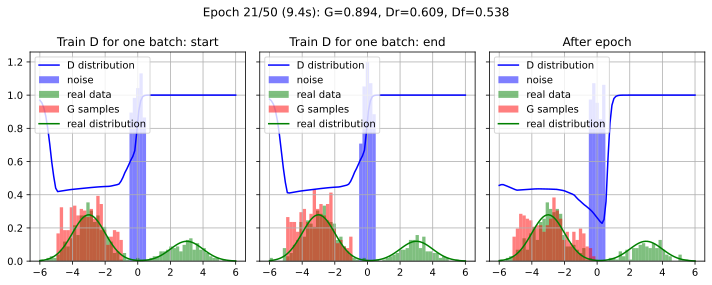

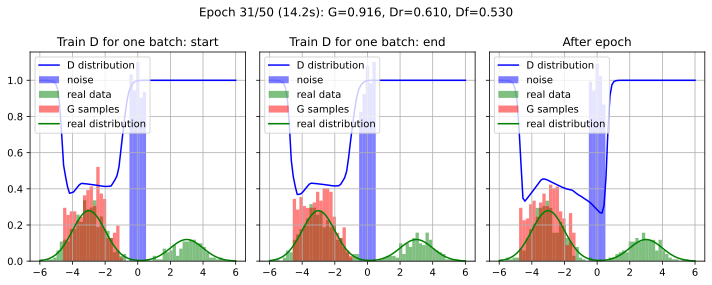

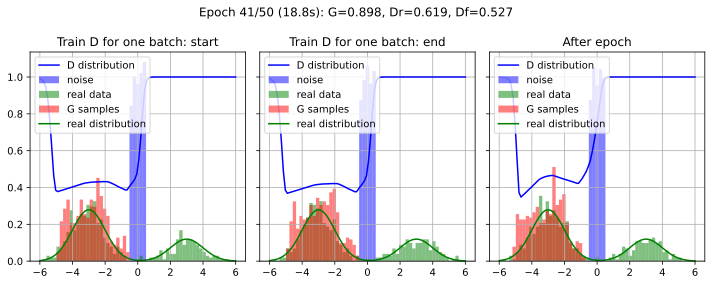

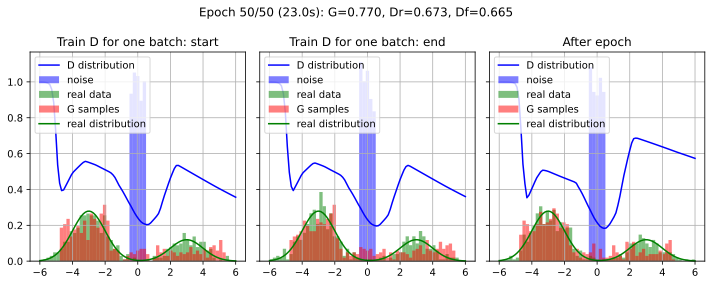

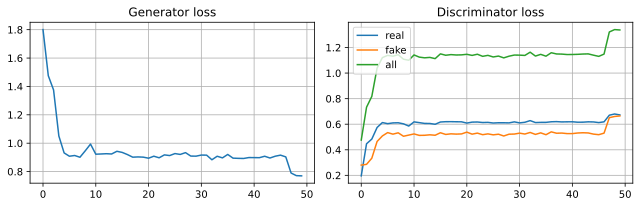

In [27]:
set_global_seed(3)

gan = get_GAN()
loss_g_1, loss_d_real_1, loss_d_fake_1 = train_1D_GAN(gan)
plot_gan_loss(loss_g_1, loss_d_real_1, loss_d_fake_1)

В конце у нас получилось засэмплировать и обеих мод, то есть модель обучилась хорошо. Попробуем теперь обучить модель, но обновлять генератор каждые 20 итераций обучений.

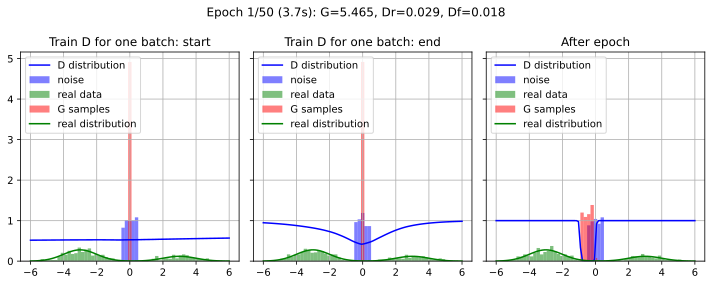

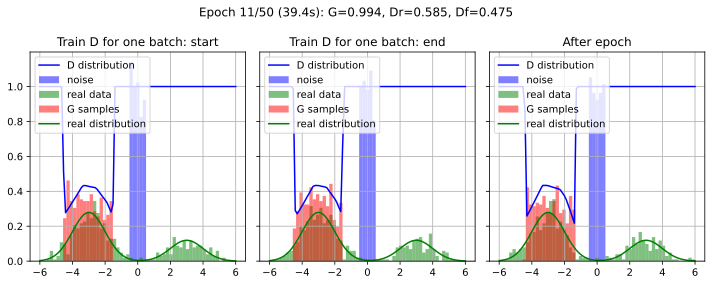

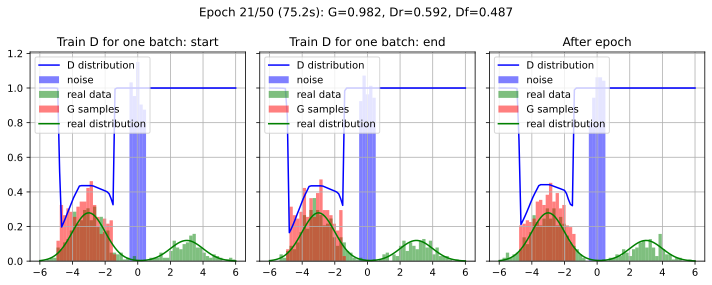

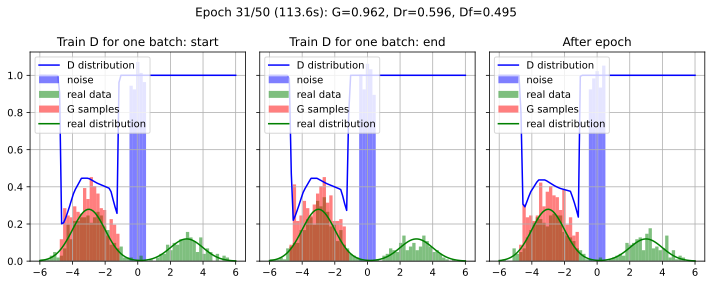

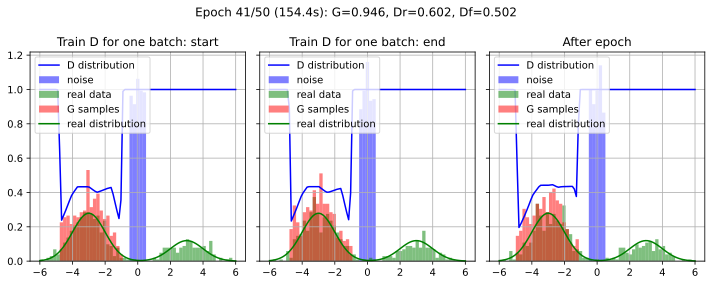

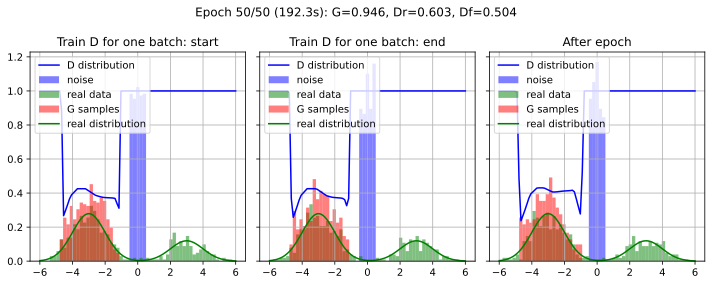

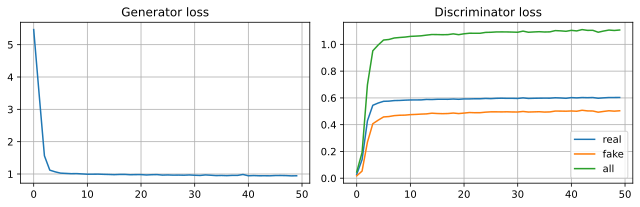

In [28]:
set_global_seed(0)

gan = get_GAN()
loss_g_20, loss_d_real_20, loss_d_fake_20 = train_1D_GAN(gan, n_D_steps_per_G=20)
plot_gan_loss(loss_g_20, loss_d_real_20, loss_d_fake_20)

Выше мы нашли инициализацию, при которой `GAN` обучается. Воспользуемся ей, для этого поставим тот же самый сид. Только теперь обучаем генератор раз в 20 итераций.

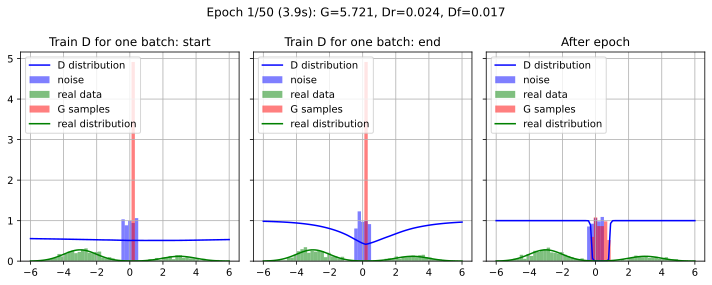

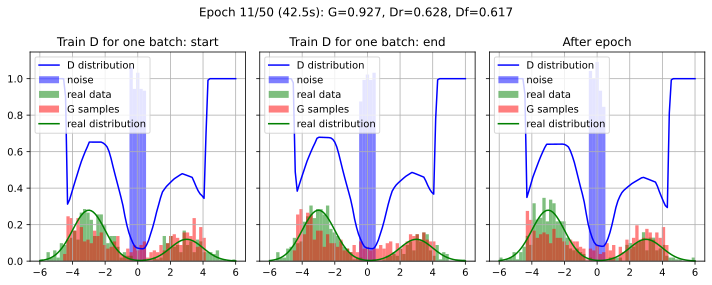

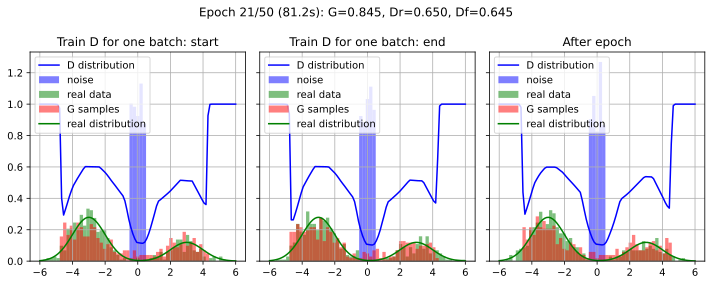

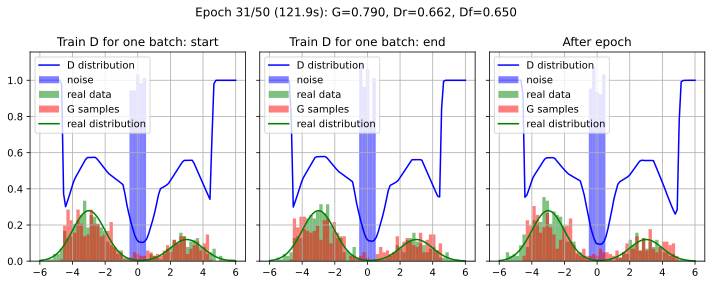

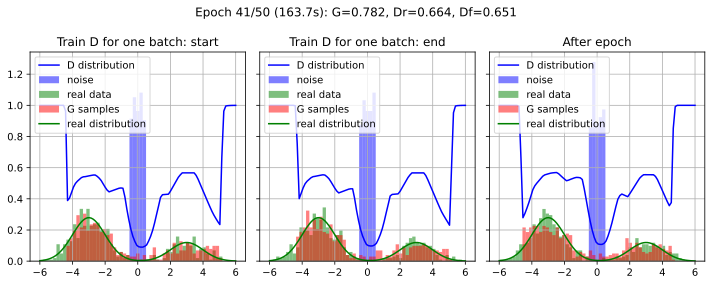

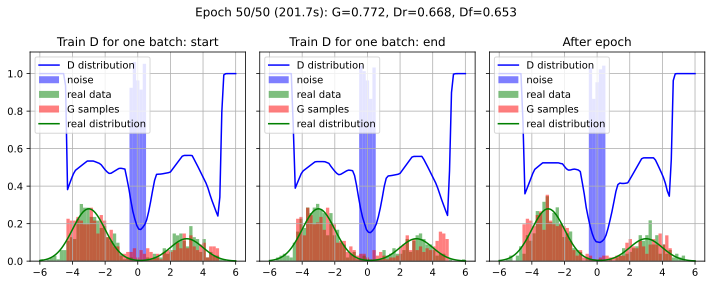

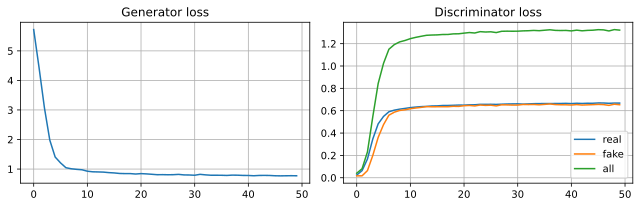

In [29]:
set_global_seed(3)

gan = get_GAN()
loss_g_20, loss_d_real_20, loss_d_fake_20 = train_1D_GAN(gan, n_D_steps_per_G=20)
plot_gan_loss(loss_g_20, loss_d_real_20, loss_d_fake_20)

Мы видим, что получилось обучить генератор уже на 11 эпохе, когда до этого на той же иницилазации мы обучились примерно на 47 эпохе. Мы получаем, что частота обновление генератора очень важна для стабильного и хорошего обучение `GAN` моделей.

### `Проблемы`

Как мы видели выше, чаще всего мы получаем данные из одной моды, что является следствием нашего функционала. После такого печального результата мы можем задуматься, а действительно ли `GAN` модели обучаемы?

Обучаемы, но есть нюанс!

Ниже представлены примеры сгенерированных изображений из оригинальной статьи (2014 год):

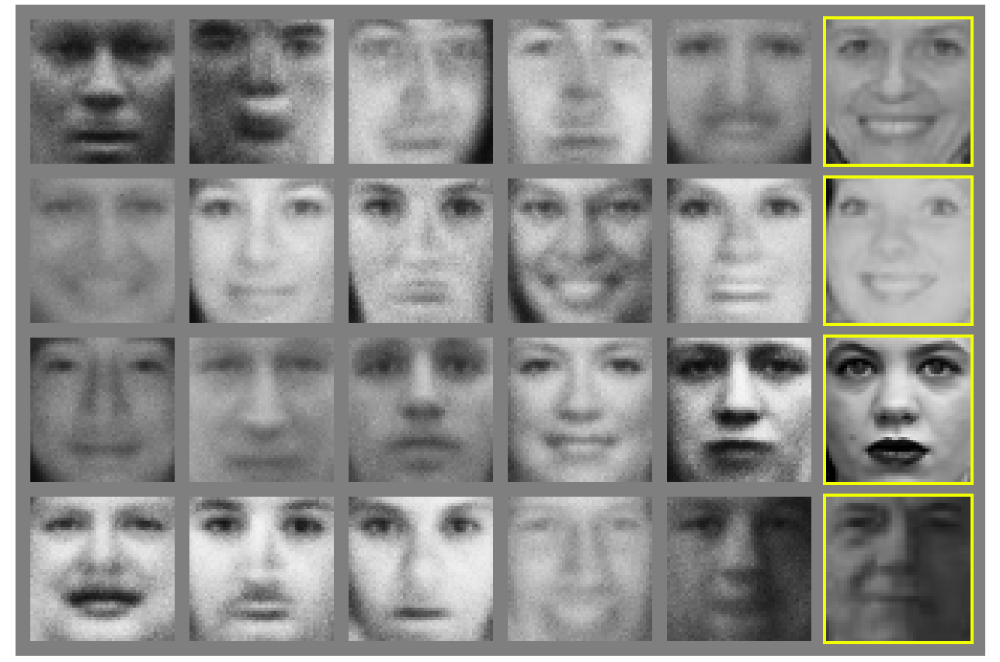

[DCGAN с кодом](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) с реализацией на PyTorch, получает такие сэмплы (2016 год)

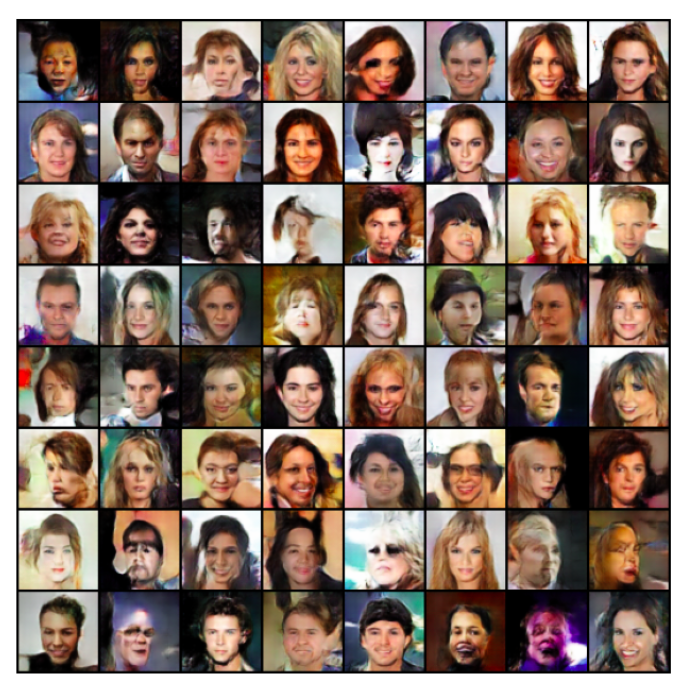

Прошло 2 года, при этом качество генерации заметно возросло, что же поменялось за это время?

1) Люди перешли к сверточным нейронным сетям и стали использовать модели с большим числом параметров;

2) Научились правильнее настраивать параметры модели и архитектуры.

Но самое важное, придумал кучу разных лайфхаков, как учить `GAN`. Примеры: [ОБЯЗАТЕЛЬНО К ПРОЧТЕНИЮ](https://github.com/soumith/ganhacks), [менее ОБЯЗАТЕЛЬНО К ПРОЧТЕНИЮ](https://arxiv.org/pdf/1701.04862.pdf)

Примеры основных трюков:
- Нормализация входа;
- Сэмплировать шум $z$ для генератора не равномерным, а из сферы (нормальный);
- Использовать SGD для дискриминатора и Adam для генератора;
- Избегать MaxPool, использовать stride свертки;
- Использовать replay buffer (класть фейковые изображения в буффер и использовать для обучения дискриминатора из буффера);
- Зашумлять входы в дискриминатор;
- Всегда использовать Dropout в генераторе (в eval и train режимах);
- и еще много всего...

##  `WGAN практика MNIST`

Мы будем реализован Wasserstein GAN с gradient penalty, так как благодаря нему модель лучше учится и градиенты меньше затухают.

Реализация взята из [github](https://github.com/eriklindernoren/PyTorch-GAN), в котором реализован зоопарк `GAN` моделей.

### `WGAN`


[WGAN](https://arxiv.org/abs/1701.07875) модель использует клиппинг весов для достижения Липшицевости функции критика.

Функция потерь
$$
\min_{G} W(\pi || p) \approx \min_{G} \max_{\boldsymbol{\phi} \in \boldsymbol{\Phi}} \left[ \mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x}, \boldsymbol{\phi})  - \mathbb{E}_{p(\mathbf{z})} f(G(\mathbf{z}, \boldsymbol{\theta}), \boldsymbol{\phi} )\right].
$$

Здесь $f(\mathbf{x}, \boldsymbol{\phi})$ модель критика. Веса критика $\boldsymbol{\phi}$ должны принадлежать компакту $\boldsymbol{\Phi} = [-c, c]^d$.

### `WGAN-GP`

[WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf) модель использует gradient penalty для достижения Липшицевости функции критика

Функция потерь
$$
    W(\pi || p) = \underbrace{\mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x})  - \mathbb{E}_{p(\mathbf{x} | \boldsymbol{\theta})} f(\mathbf{x})}_{\text{original critic loss}} + \lambda \underbrace{\mathbb{E}_{U[0, 1]} \left[ \left( \| \nabla_{\hat{\mathbf{x}}} f(\hat{\mathbf{x}}) \|_2 - 1 \right) ^ 2\right]}_{\text{gradient penalty}},
$$
где сэмплы $\hat{\mathbf{x}}_t = t \mathbf{x} + (1 - t) \mathbf{y}$ с $t \in [0, 1]$ равномерно засэмплированы вдоль прямой соединяющей точки: $\mathbf{x}$ из распределения данных $\pi(\mathbf{x})$ и $\mathbf{y}$ распределения генератора $p(\mathbf{x} \mid \boldsymbol{\theta})$.

Обновлять дискриминатор мы будем обновлять каждый шаг, а генератор каждый пятый шаг.

In [30]:
opt = ConfigDict()

# обучение
opt.n_epochs = 200
opt.batch_size = 64

# оптимизатор
opt.lr = 0.0002
opt.beta1 = 0.5
opt.beta2 = 0.999

# модель
opt.latent_dim = 100
opt.img_size = 28
opt.channels = 1
opt.img_shape = (opt.channels, opt.img_size, opt.img_size)

# обучение GAN
opt.lambda_gp = 10
opt.n_critic = 5
opt.clip_value = 0.01
opt.sample_interval = 2000

opt

batch_size: 64
beta1: 0.5
beta2: 0.999
channels: 1
clip_value: 0.01
img_shape: !!python/tuple
- 1
- 28
- 28
img_size: 28
lambda_gp: 10
latent_dim: 100
lr: 0.0002
n_critic: 5
n_epochs: 200
sample_interval: 2000

In [31]:
device = torch.device('cuda', 0) if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda', index=0)

In [32]:
path = '../../data/mnist'
os.makedirs(path, exist_ok=True)

forward_transform = transforms.Compose([
    transforms.Resize(opt.img_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

inverse_transform = transforms.Compose([
    transforms.Normalize([0.0], [2.0]),
    transforms.Normalize([-0.5], [1.0]),
    transforms.ToPILImage()
])

dataset = MNIST(path, train=True, download=True, transform=forward_transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=opt.batch_size, shuffle=True)

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████████████████████████████████| 9912422/9912422 [00:02<00:00, 3531797.08it/s]


Extracting ../../data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to ../../data/mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|███████████████████████████████████████████| 28881/28881 [00:00<00:00, 208122.27it/s]


Extracting ../../data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to ../../data/mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████████████████████████████████| 1648877/1648877 [00:00<00:00, 2084745.64it/s]


Extracting ../../data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to ../../data/mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|████████████████████████████████████████████| 4542/4542 [00:00<00:00, 1114391.86it/s]

Extracting ../../data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../../data/mnist/MNIST/raw



### `Генератор`

Для генератора мы будем брать сверточную архитектуру.

In [33]:
class Generator(torch.nn.Module):
    def __init__(self, config):
        super().__init__()

        self.config = config

        def block(in_feat, out_feat, normalize=True):
            layers = [torch.nn.Linear(in_feat, out_feat)]
            if normalize:
                layers += [torch.nn.BatchNorm1d(out_feat, 0.8)]
            layers += [torch.nn.LeakyReLU(0.2, inplace=True)]
            return layers

        self.model = torch.nn.Sequential(
            *block(config.latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            torch.nn.Linear(1024, int(np.prod(config.img_shape))),
            torch.nn.Tanh()
        )

    def forward(self, z):
        images = self.model(z)
        images = images.view(images.shape[0], *self.config.img_shape)

        return images

### `Дискриминатор (критик)`

Очень важно параметризовать дискриминатор не

In [34]:
class Discriminator(torch.nn.Module):
    def __init__(self, config):
        super().__init__()

        self.config = config

        self.model = torch.nn.Sequential(
            torch.nn.Linear(np.prod(self.config.img_shape), 512),
            torch.nn.LeakyReLU(0.2, inplace=True),
            torch.nn.Linear(512, 256),
            torch.nn.LeakyReLU(0.2, inplace=True),
            torch.nn.Linear(256, 1),
        )

    def forward(self, image):
        image = image.flatten(start_dim=1)
        logits = self.model(image)

        return logits

### `Определение модели`

In [35]:
# Initialize generator and discriminator
generator = Generator(config=opt).to(device)
discriminator = Discriminator(config=opt).to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.beta1, opt.beta2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.beta1, opt.beta2))

In [36]:
generator, discriminator

(Generator(
   (model): Sequential(
     (0): Linear(in_features=100, out_features=128, bias=True)
     (1): LeakyReLU(negative_slope=0.2, inplace=True)
     (2): Linear(in_features=128, out_features=256, bias=True)
     (3): BatchNorm1d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (4): LeakyReLU(negative_slope=0.2, inplace=True)
     (5): Linear(in_features=256, out_features=512, bias=True)
     (6): BatchNorm1d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (7): LeakyReLU(negative_slope=0.2, inplace=True)
     (8): Linear(in_features=512, out_features=1024, bias=True)
     (9): BatchNorm1d(1024, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (10): LeakyReLU(negative_slope=0.2, inplace=True)
     (11): Linear(in_features=1024, out_features=784, bias=True)
     (12): Tanh()
   )
 ),
 Discriminator(
   (model): Sequential(
     (0): Linear(in_features=784, out_features=512, bias=True)
     (1): LeakyReLU(negative_sl

### `Gradient penalty`

\begin{align}
\text{GP}(f) = \mathbb{E}_{U[0, 1]} \left[ \left( \| \nabla_{\hat{\mathbf{x}}} f(\hat{\mathbf{x}}) \|_2 - 1 \right) ^ 2\right],
\end{align}
где сэмплы $\hat{\mathbf{x}}_t = t \mathbf{x} + (1 - t) \mathbf{y}$ с $t \in [0, 1]$ равномерно засэмплированы вдоль прямой соединяющей точки: $\mathbf{x}$ из распределения данных $\pi(\mathbf{x})$ и $\mathbf{y}$ распределения генератора $p(\mathbf{x} \mid \boldsymbol{\theta})$.

In [37]:
def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""

    # Random weight term for interpolation between real and fake samples
    alpha = torch.rand((real_samples.size(0), 1, 1, 1), device=real_samples.device)

    # Get random interpolation between real and fake samples
    interpolates = torch.lerp(real_samples, fake_samples, alpha).requires_grad_(True)
    logits = D(interpolates)

    fake = torch.ones((real_samples.shape[0], 1), device=real_samples.device, requires_grad=False)

    # Get gradient w.r.t. interpolates
    gradients = torch.autograd.grad(
        outputs=logits,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True, retain_graph=True
    )[0]

    gradients = gradients.flatten(start_dim=1)
    gradient_penalty = torch.mean(
        torch.square(
            torch.linalg.norm(gradients, dim=1) - 1.0
        )
    )

    return gradient_penalty

### `Обучение`

Посмотреть результат обучения можно [по ссылке на wandb](https://wandb.ai/nakhodnov17/mmp_practicum_spring_2024%7CSeminar%2011%7CWGAN-GP/runs/o7qnv1aq)

In [ ]:
# ----------
#  Training
# ----------

api = wandb.Api()
api.client.execute(
    api.CREATE_PROJECT,
    {
        'entityName': 'nakhodnov17',
        'name': 'mmp_practicum_spring_2024|Seminar 11|WGAN-GP',
        'access': 'USER_READ',
    },
)

wandb.init(
    entity='nakhodnov17',
    project='mmp_practicum_spring_2024|Seminar 11|WGAN-GP',
    save_code=True,
    name='WGAN-GP-MNIST'
)

batches_done = 0
try:
    for epoch in range(opt.n_epochs):
        for idx, (real_images, _) in enumerate(dataloader):
            real_images = real_images.to(device)

            # ---------------------
            #  Train Discriminator
            # ---------------------

            optimizer_D.zero_grad()

            # Sample noise as generator input
            z = torch.randn((real_images.shape[0], opt.latent_dim), device=device)

            # Generate a batch of images
            fake_images = generator(z)

            # Real images
            real_logits = discriminator(real_images)
            # Fake images
            fake_logits = discriminator(fake_images)
            # Gradient penalty
            gradient_penalty = compute_gradient_penalty(discriminator, real_images.detach(), fake_images.detach())
            # Adversarial loss
            d_loss = -torch.mean(real_logits) + torch.mean(fake_logits) + opt.lambda_gp * gradient_penalty

            d_loss.backward()
            optimizer_D.step()

            # -----------------
            #  Train Generator
            # -----------------

            # Train the generator every n_critic steps
            if idx % opt.n_critic == 0:
                optimizer_G.zero_grad()

                # Generate a batch of images
                fake_images = generator(z)

                # Loss measures generator's ability to fool the discriminator
                # Train on fake images
                fake_logits = discriminator(fake_images)
                g_loss = -torch.mean(fake_logits)

                g_loss.backward()
                optimizer_G.step()

                wandb.log(
                    {'G_loss': g_loss.item(), 'D_loss':  d_loss.item(), 'Penalty': gradient_penalty.item()},
                    step=batches_done
                )

                if batches_done % opt.sample_interval == 0:
                    fake_grid = transforms.functional.to_pil_image(
                        make_grid(fake_images, nrow=8, padding=0)
                    )
                    real_grid = inverse_transform(make_grid(real_images, nrow=8, padding=0))

                    wandb.log({"Fake images": wandb.Image(fake_grid)}, step=batches_done)
                    wandb.log({"Real images": wandb.Image(real_grid)}, step=batches_done)

                batches_done += opt.n_critic
except KeyboardInterrupt:
    pass

wandb.finish()

wandb: Currently logged in as: nakhodnov17. Use `wandb login --relogin` to force relogin


D_loss,▁▁▄▅▅▆▆▆▆▇▇▇▇▇▇▆▇██▇▇▇▇▇▇▇█▇█▇▇▇█▇▇█▇▇▇█
G_loss,▇█▆▃▁▂▃▂▁▁▃▃▂▂▃▃▂▂▂▂▃▃▃▃▂▂▃▃▂▂▂▂▃▂▃▂▃▂▃▄
Penalty,█▆▃▂▃▂▂▁▂▂▁▂▂▁▁▁▁▂▁▁▂▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁
D_loss,-1.00936
G_loss,-1.8709
Penalty,0.00726


In [ ]:
torch.save({
        "generator": generator.state_dict(),
        "discriminator": discriminator.state_dict()
    }, "checkpoint.pth"
)